In [1]:
import torch
torch.cuda.empty_cache()
import torch.nn as nn
import torchvision
import torch.nn.functional as F
import numpy as np 
from matplotlib import pyplot as plt
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torch.optim as optim
from torch.utils.data import random_split
from torchvision import models,datasets
import os
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from PIL import Image
from tqdm import tqdm
from torch.optim import lr_scheduler

In [2]:
USE_GPU = True

if USE_GPU and torch.cuda.is_available():
    print('using device: cuda')
else:
    print('using device: cpu')

device = torch.device("cuda:0" if USE_GPU else "cpu")

using device: cuda


In [3]:
#Hyperparamters
BATCH_SIZE = 32

In [4]:
import torchvision.transforms as transforms
train_transform = transforms.Compose([
        transforms.Resize((128,128)),
        #transforms.RandomResizedCrop(256),
        transforms.RandomHorizontalFlip(),
        #transforms.ColorJitter(),
        transforms.ToTensor(),
        transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])
])

test_transform = transforms.Compose([
        transforms.Resize((128,128)),
        #transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])
    ])

In [5]:
class Flare(Dataset):
    def __init__(self, flare_dir,without_dir, transform = None):
        self.flare_dir = flare_dir
        self.without_dir = without_dir
        self.transform = transform
        self.flare_images = os.listdir(flare_dir)
        self.without_images = os.listdir(without_dir)
        
    def __len__(self):
        return max(len(self.flare_images),len(self.without_images))
    
    def __getitem__(self,idx):
        
        f_img = (Image.open(os.path.join(self.flare_dir,self.flare_images[idx%len(self.flare_images)])).convert("RGB"))
        w_img = (Image.open(os.path.join(self.without_dir, self.without_images[idx%len(self.without_images)])).convert("RGB"))
        f_img = self.transform(f_img)
        w_img = self.transform(w_img)
       
        
        return f_img, w_img

In [6]:
class Flare(Dataset):
    def __init__(self, flare_dir,without_dir, transform = None):
        self.flare_dir = flare_dir
        self.without_dir = without_dir
        self.transform = transform
        self.flare_images = os.listdir(flare_dir)
        self.without_images = os.listdir(without_dir)
        
    def __len__(self):
        return max(len(self.flare_images),len(self.without_images))
    
    def __getitem__(self,idx):
        
        f_img = (Image.open(os.path.join(self.flare_dir,self.flare_images[idx%len(self.flare_images)])).convert("RGB"))
        w_img = (Image.open(os.path.join(self.without_dir, self.without_images[idx%len(self.without_images)])).convert("RGB"))
        f_img = self.transform(f_img)
        w_img = self.transform(w_img)
       
        
        return f_img, w_img

In [7]:
flare_dir = "../input/monet2photo/trainA"
without_dir = "../input/monet2photo/trainB"

train_ds = Flare(flare_dir, without_dir, train_transform)
print(len(train_ds))
train_loader = torch.utils.data.DataLoader(dataset = train_ds, 
                                           batch_size = BATCH_SIZE,
                                          shuffle = True)
print(train_loader)

6287


In [8]:
z,h = next(iter(train_loader))
print(h.shape)

torch.Size([32, 3, 128, 128])


torch.Size([32, 3, 128, 128])
(3, 522, 1042)


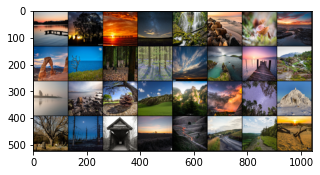

In [9]:
import matplotlib.pyplot as plt
import numpy
zebras, horses = iter(train_loader).next()
print(horses.shape)
plt.figure(figsize=(5,10))
grid_imgs = torchvision.utils.make_grid(horses, normalize = True).numpy()
print(grid_imgs.shape)
# in tensor, image is (batch, width, height), so you have to transpose it to (width, height, batch) in numpy to show it.
plt.imshow(np.transpose((grid_imgs),(1,2,0)))

In [10]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, down=True, use_act=True, **kwargs):
        super().__init__()
        self.conv = nn.Sequential(
            nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs))
            if down
            else nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, **kwargs)),
            nn.InstanceNorm2d(out_channels),
            nn.ReLU(inplace=True) if use_act else nn.Identity()
        )

    def forward(self, x):
        return self.conv(x)

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            ConvBlock(channels, channels, kernel_size=3, padding=1),
            ConvBlock(channels, channels, use_act=False, kernel_size=3, padding=1),
        )

    def forward(self, x):
        return x + self.block(x)

class Generator(nn.Module):
    def __init__(self, img_channels, num_features = 32, num_residuals=6):
        super().__init__()
        self.initial = nn.Sequential(
            nn.utils.spectral_norm(nn.Conv2d(img_channels, num_features, kernel_size=7, stride=1, padding=3, padding_mode="reflect")),
            nn.InstanceNorm2d(num_features),
            nn.ReLU(inplace=True),
        )
        self.down_blocks = nn.ModuleList(
            [
                ConvBlock(num_features, num_features*2, kernel_size=3, stride=2, padding=1),
                ConvBlock(num_features*2, num_features*4, kernel_size=3, stride=2, padding=1),
            ]
        )
        self.res_blocks = nn.Sequential(
            *[ResidualBlock(num_features*4) for _ in range(num_residuals)]
        )
        self.up_blocks = nn.ModuleList(
            [
                ConvBlock(num_features*4, num_features*2, down=False, kernel_size=3, stride=2, padding=1, output_padding=1),
                ConvBlock(num_features*2, num_features*1, down=False, kernel_size=3, stride=2, padding=1, output_padding=1),
            ]
        )

        self.last = nn.utils.spectral_norm(nn.Conv2d(num_features*1, img_channels, kernel_size=7, stride=1, padding=3, padding_mode="reflect"))

    def forward(self, x):
        x = self.initial(x)
        for layer in self.down_blocks:
            x = layer(x)
        x = self.res_blocks(x)
        for layer in self.up_blocks:
            x = layer(x)
        return torch.tanh(self.last(x))

In [11]:
class Block(nn.Module):
    def __init__(self, in_channels, out_channels, stride):
        super().__init__()
        self.conv = nn.Sequential(
            nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, 4, stride, 1, bias=True, padding_mode="reflect")),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class Discriminator(nn.Module):
    def __init__(self, in_channels=3, features=[32, 64, 128, 256]):
        super().__init__()
        self.initial = nn.Sequential(
            nn.utils.spectral_norm(nn.Conv2d(
                in_channels,
                features[0],
                kernel_size=4,
                stride=2,
                padding=1,
                padding_mode="reflect",
            )),
            nn.LeakyReLU(0.2, inplace=True),
        )

        layers = []
        in_channels = features[0]
        for feature in features[1:]:
            layers.append(Block(in_channels, feature, stride=1 if feature==features[-1] else 2))
            in_channels = feature
        layers.append(nn.utils.spectral_norm(nn.Conv2d(in_channels, 1, kernel_size=4, stride=1, padding=1, padding_mode="reflect")))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = self.initial(x)
        return torch.sigmoid(self.model(x))



In [12]:
g = Generator(3)
i = torch.randn(1,3,64,64)
n = g(i)
print(g)

Generator(
  (initial): Sequential(
    (0): Conv2d(3, 32, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), padding_mode=reflect)
    (1): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (2): ReLU(inplace=True)
  )
  (down_blocks): ModuleList(
    (0): ConvBlock(
      (conv): Sequential(
        (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), padding_mode=reflect)
        (1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (2): ReLU(inplace=True)
      )
    )
    (1): ConvBlock(
      (conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), padding_mode=reflect)
        (1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (2): ReLU(inplace=True)
      )
    )
  )
  (res_blocks): Sequential(
    (0): ResidualBlock(
      (block): Sequential(
        (0): ConvBlock(
          (conv): Sequ

In [13]:
#lrg = 6e-6
#lrd = 2e-7
lrg = 5e-5
lrd = 5e-5
lambda_cycle = 10
NUM_EPOCHS = 50

In [14]:
disc_I = Discriminator(3).to(device)
disc_M = Discriminator(3).to(device)
gen_I = Generator(3).to(device)
gen_M = Generator(3).to(device)
opt_disc = optim.SGD(
list(disc_I.parameters()) +list(disc_M.parameters()), lrd)
opt_gen = optim.Adam(
list(gen_I.parameters()) +list(gen_M.parameters()), lrg, betas = (0.5,0.999) 
)

L1 = nn.L1Loss()
mse = nn.MSELoss()
d_scaler = torch.cuda.amp.GradScaler()
g_scaler = torch.cuda.amp.GradScaler()
sch_D = lr_scheduler.StepLR(opt_disc, step_size=25, gamma=0.85)
sch_G = lr_scheduler.StepLR(opt_gen, step_size=25, gamma=0.85)

In [15]:
def train_fn(disc_H, disc_Z, gen_Z, gen_H, loader, opt_disc, opt_gen, l1, mse, d_scaler, g_scaler):
   # for epoch in range(NUM_EPOCHS):
        I_reals = 0
        I_fakes = 0
        loop = tqdm(loader, leave=True)

        for idx, (monet, image) in enumerate(loop):
            monet = monet.to(device).float()
            image = image.to(device).float()
            decaying_noise = torch.randn(monet.shape[0],3,128,128).to(device)*(0.9**epoch)
            decaying_noise_ = torch.randn(image.shape[0],3,128,128).to(device)*(0.9**epoch)
            monet = monet+decaying_noise
            image = image+decaying_noise_
            # Train Discriminators H and Z
            with torch.cuda.amp.autocast():
                fake_image = gen_I(monet)+decaying_noise_
                D_I_real = disc_I(image)
                D_I_fake = disc_I(fake_image.detach())
                I_reals += D_I_real.mean().item()
                I_fakes += D_I_fake.mean().item()
                D_I_real_loss = mse(D_I_real, torch.ones_like(D_I_real)*0.9)
                D_I_fake_loss = mse(D_I_fake, torch.ones_like(D_I_fake)*0.1)
                D_I_loss = D_I_real_loss + D_I_fake_loss

                fake_monet = gen_M(image)+decaying_noise
                D_M_real = disc_M(monet)
                D_M_fake = disc_M(fake_monet.detach())
                D_M_real_loss = mse(D_M_real, torch.ones_like(D_M_real)*0.9)
                D_M_fake_loss = mse(D_M_fake, torch.ones_like(D_M_fake)*0.1)
                D_M_loss = D_M_real_loss + D_M_fake_loss

                # put it togethor
                D_loss = (D_M_loss + D_I_loss)/2
                
            opt_disc.zero_grad()
            d_scaler.scale(D_loss).backward()
            d_scaler.step(opt_disc)
            d_scaler.update()

            # Train Generators H and Z
            with torch.cuda.amp.autocast():
                # adversarial loss for both generators
                D_I_fake = disc_I(fake_image)
                D_M_fake = disc_M(fake_monet)
                loss_G_I = mse(D_I_fake, torch.ones_like(D_I_fake)*0.9)
                loss_G_M = mse(D_M_fake, torch.ones_like(D_M_fake)*0.9)

                # cycle loss
                cycle_monet = gen_M(fake_image)
                cycle_image = gen_I(fake_monet)
                cycle_monet_loss = l1(monet, cycle_monet)
                cycle_image_loss = l1(image, cycle_image)

                # identity loss (remove these for efficiency if you set lambda_identity=0)
                #identity_zebra = gen_Z(zebra)
                #identity_horse = gen_H(horse)
                #identity_zebra_loss = l1(zebra, identity_zebra)
                #identity_horse_loss = l1(horse, identity_horse)

                # add all together
                G_loss = (
                    loss_G_M
                    + loss_G_I
                    + cycle_monet_loss * lambda_cycle
                    + cycle_image_loss * lambda_cycle

                )

            opt_gen.zero_grad()
            g_scaler.scale(G_loss).backward()
            g_scaler.step(opt_gen)
            g_scaler.update()
            loop.set_postfix(I_real=I_reals/(idx+1), I_fake=I_fakes/(idx+1),D_loss= D_loss,G_loss=G_loss)
            
           

100%|██████████| 197/197 [06:09<00:00,  1.88s/it, D_loss=tensor(0.3671, device='cuda:0', grad_fn=<DivBackward0>), G_loss=tensor(17.2111, device='cuda:0', grad_fn=<AddBackward0>), I_fake=0.511, I_real=0.51] 


EPOCH  1  OVER
Epoch: 1 LR_D: [5e-05] LR_G: [5e-05]


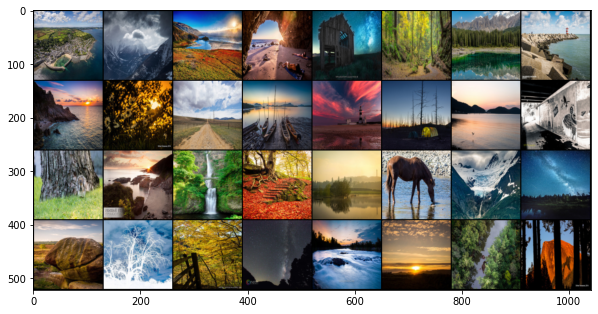

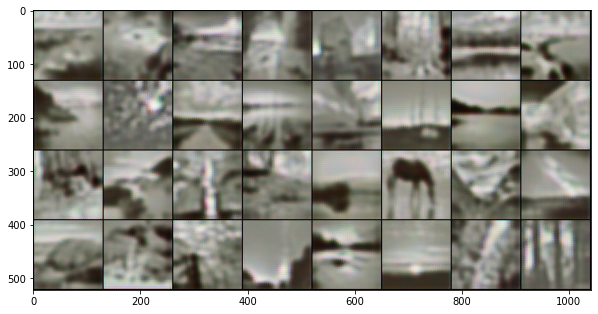

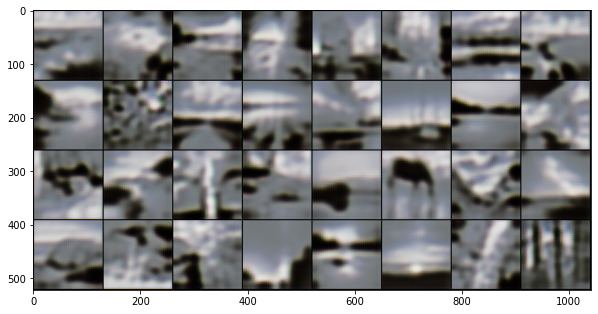

  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  2  OVER
Epoch: 2 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  3  OVER
Epoch: 3 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  4  OVER
Epoch: 4 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  5  OVER
Epoch: 5 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  6  OVER
Epoch: 6 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  7  OVER
Epoch: 7 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  8  OVER
Epoch: 8 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  9  OVER
Epoch: 9 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  10  OVER
Epoch: 10 LR_D: [5e-05] LR_G: [5e-05]


100%|██████████| 197/197 [04:44<00:00,  1.44s/it, D_loss=tensor(0.3632, device='cuda:0', grad_fn=<DivBackward0>), G_loss=tensor(6.7426, device='cuda:0', grad_fn=<AddBackward0>), I_fake=0.503, I_real=0.497]


EPOCH  11  OVER
Epoch: 11 LR_D: [5e-05] LR_G: [5e-05]


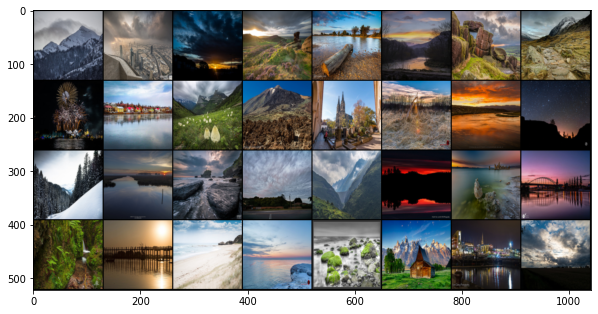

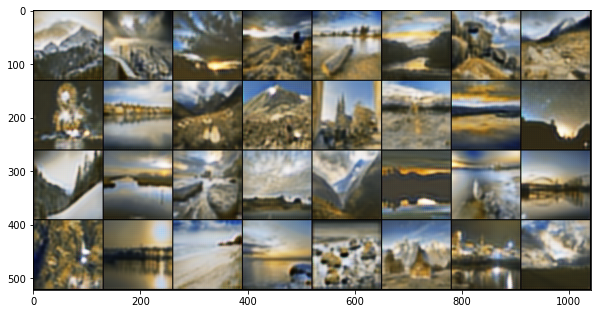

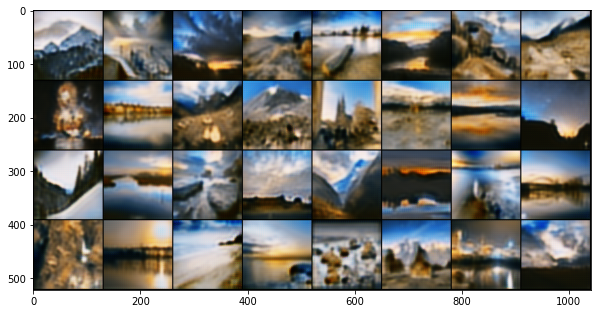

  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  12  OVER
Epoch: 12 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  13  OVER
Epoch: 13 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  14  OVER
Epoch: 14 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  15  OVER
Epoch: 15 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  16  OVER
Epoch: 16 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  17  OVER
Epoch: 17 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  18  OVER
Epoch: 18 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  19  OVER
Epoch: 19 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  20  OVER
Epoch: 20 LR_D: [5e-05] LR_G: [5e-05]


100%|██████████| 197/197 [04:45<00:00,  1.45s/it, D_loss=tensor(0.3589, device='cuda:0', grad_fn=<DivBackward0>), G_loss=tensor(3.5315, device='cuda:0', grad_fn=<AddBackward0>), I_fake=0.503, I_real=0.497]


EPOCH  21  OVER
Epoch: 21 LR_D: [5e-05] LR_G: [5e-05]


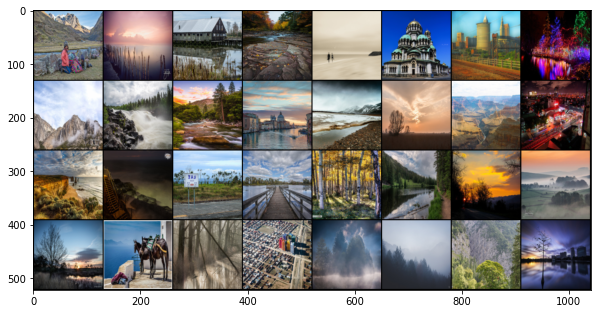

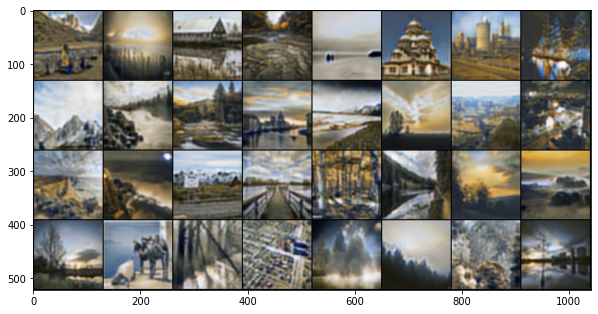

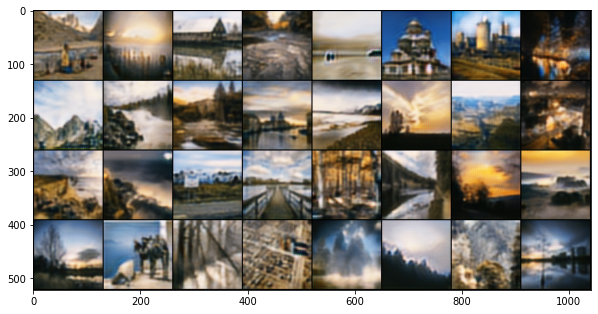

  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  22  OVER
Epoch: 22 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  23  OVER
Epoch: 23 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  24  OVER
Epoch: 24 LR_D: [5e-05] LR_G: [5e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  25  OVER
Epoch: 25 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  26  OVER
Epoch: 26 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  27  OVER
Epoch: 27 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  28  OVER
Epoch: 28 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  29  OVER
Epoch: 29 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  30  OVER
Epoch: 30 LR_D: [4.25e-05] LR_G: [4.25e-05]


100%|██████████| 197/197 [04:46<00:00,  1.45s/it, D_loss=tensor(0.3582, device='cuda:0', grad_fn=<DivBackward0>), G_loss=tensor(2.9679, device='cuda:0', grad_fn=<AddBackward0>), I_fake=0.5, I_real=0.496]  


EPOCH  31  OVER
Epoch: 31 LR_D: [4.25e-05] LR_G: [4.25e-05]


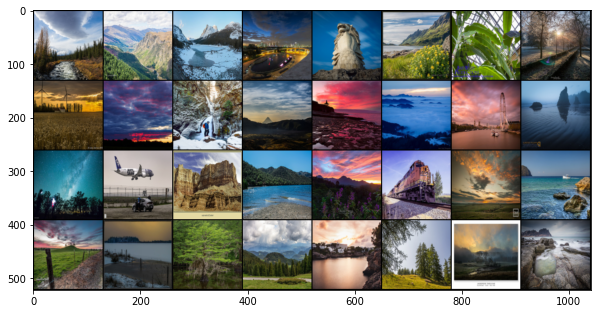

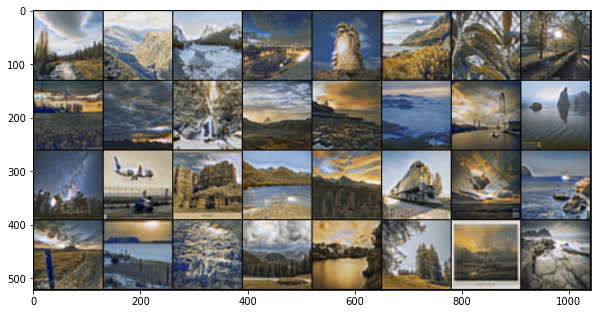

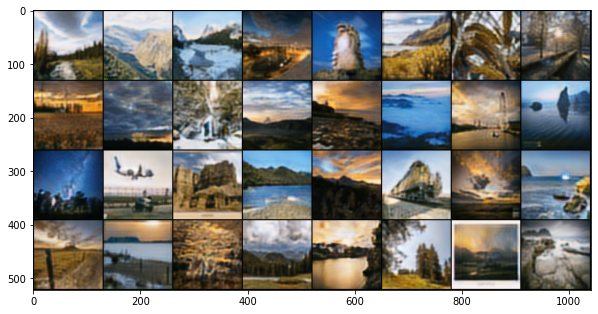

  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  32  OVER
Epoch: 32 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  33  OVER
Epoch: 33 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  34  OVER
Epoch: 34 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  35  OVER
Epoch: 35 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  36  OVER
Epoch: 36 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  37  OVER
Epoch: 37 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  38  OVER
Epoch: 38 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  39  OVER
Epoch: 39 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  40  OVER
Epoch: 40 LR_D: [4.25e-05] LR_G: [4.25e-05]


100%|██████████| 197/197 [04:45<00:00,  1.45s/it, D_loss=tensor(0.3537, device='cuda:0', grad_fn=<DivBackward0>), G_loss=tensor(2.7095, device='cuda:0', grad_fn=<AddBackward0>), I_fake=0.498, I_real=0.498]


EPOCH  41  OVER
Epoch: 41 LR_D: [4.25e-05] LR_G: [4.25e-05]


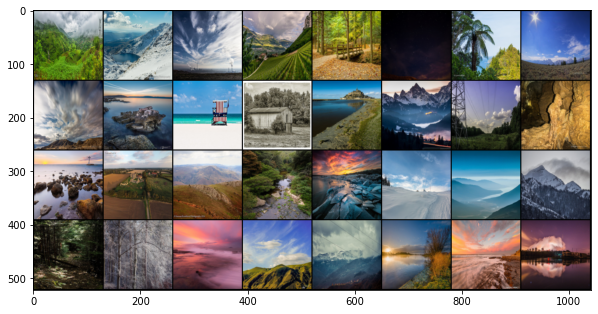

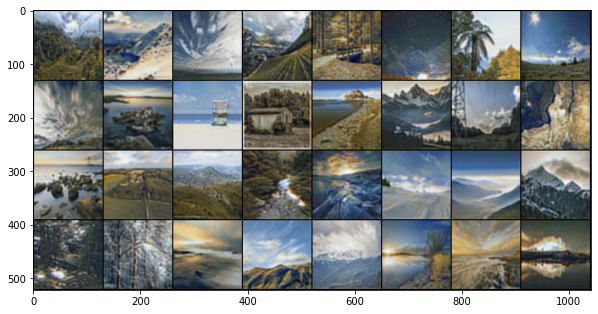

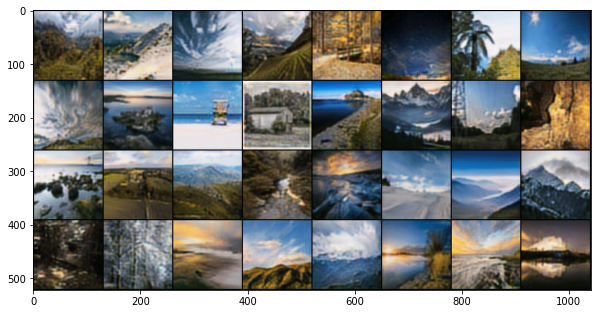

  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  42  OVER
Epoch: 42 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  43  OVER
Epoch: 43 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  44  OVER
Epoch: 44 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  45  OVER
Epoch: 45 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  46  OVER
Epoch: 46 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  47  OVER
Epoch: 47 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  48  OVER
Epoch: 48 LR_D: [4.25e-05] LR_G: [4.25e-05]


  0%|          | 0/197 [00:00<?, ?it/s]

EPOCH  49  OVER
Epoch: 49 LR_D: [4.25e-05] LR_G: [4.25e-05]


100%|██████████| 197/197 [04:46<00:00,  1.45s/it, D_loss=tensor(0.3483, device='cuda:0', grad_fn=<DivBackward0>), G_loss=tensor(2.4024, device='cuda:0', grad_fn=<AddBackward0>), I_fake=0.497, I_real=0.499]

EPOCH  50  OVER
Epoch: 50 LR_D: [3.6125000000000004e-05] LR_G: [3.6125000000000004e-05]


In [16]:
for epoch in range(NUM_EPOCHS):
    train_fn(disc_I,disc_M,gen_I,gen_M,train_loader,opt_disc,opt_gen,L1,mse,d_scaler,g_scaler)
    sch_D.step()
    sch_G.step()
    m, i = next(iter(train_loader))
    i = i.to(device).float()
    img = i.cpu().squeeze()
    with torch.no_grad():
                        print("EPOCH ",epoch+1," OVER")
                        print('Epoch:', epoch+1,'LR_D:', sch_D.get_last_lr(),'LR_G:',sch_G.get_last_lr())
                        #print("D_Loss : ",running_d_loss/84,"G_loss : ", running_g_loss/84)
                        #print("GH:",GH_loss, "GZ:", GZ_loss,"Cycle ZL:", cycle_ZL, "Cycle_HL",cycle_HL)
                        if (epoch%10 == 0):
                            grid_imgs = torchvision.utils.make_grid(img, normalize = True).numpy()
                            plt.figure(figsize=(10,40))
                            plt.imshow(np.transpose((grid_imgs),(1,2,0)))
                            plt.show()
                            fake_m = gen_M(i).detach().to(device)
                            reconstructed_i = gen_I(fake_m).detach().cpu()

                            img1 = fake_m.cpu()
                            grid_imgs1 = torchvision.utils.make_grid(img1, normalize = True).numpy()
                            plt.figure(figsize=(10,40))
                            plt.imshow(np.transpose(grid_imgs1,(1,2,0)))
                            plt.show()
                            img2 = reconstructed_i.cpu()
                            grid_imgs2 = torchvision.utils.make_grid(img2, normalize = True).numpy()
                            plt.figure(figsize=(10,40))
                            plt.imshow(np.transpose(grid_imgs2,(1,2,0)))
                            plt.show()

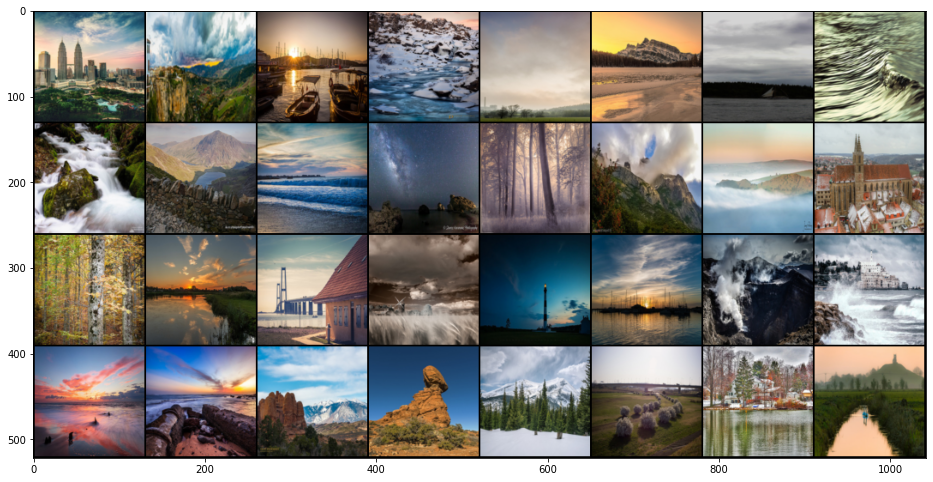

torch.Size([32, 3, 128, 128])


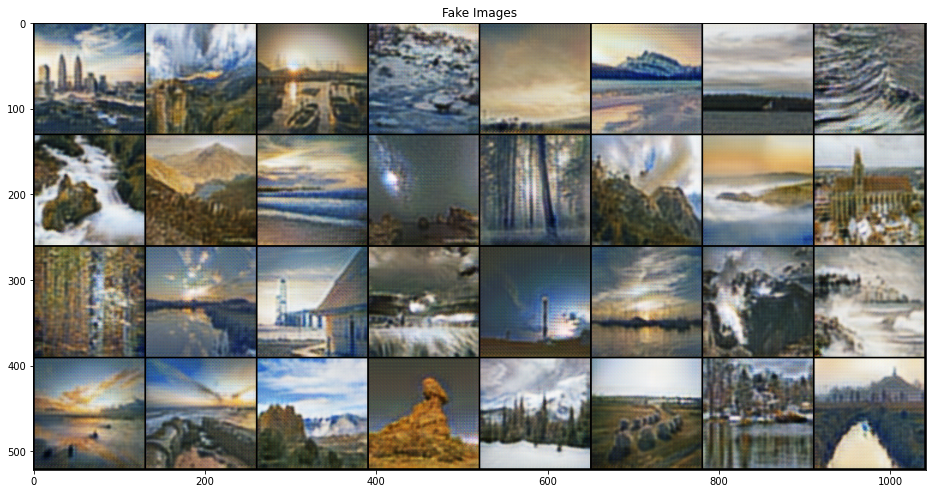

torch.Size([32, 3, 128, 128])


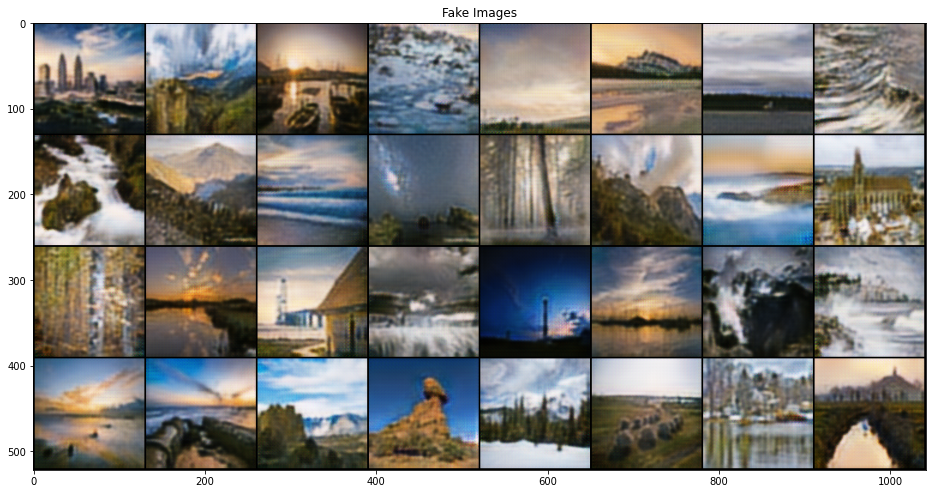

In [18]:
l,k = next(iter(train_loader))
l = l.to(device)
k = k.to(device)
i = gen_M(k).to(device).detach()
j = gen_I(l).to(device).detach()
r_i = gen_I(i).detach()
r_m = gen_M(j).detach()

plt.figure(figsize=(16,24))
img_grid = torchvision.utils.make_grid(k.cpu(),normalize = True)
plt.imshow(np.transpose(img_grid,(1,2,0)))
plt.show()

plt.figure(figsize=(16,24))
plt.title("Fake Images")
img_grid = torchvision.utils.make_grid(i.cpu(),normalize = True)
print(i.shape)
plt.imshow(np.transpose(img_grid,(1,2,0)))
plt.show()

plt.figure(figsize=(16,24))
plt.title("Fake Images")
img_grid = torchvision.utils.make_grid(r_i.cpu(),normalize = True)
print(i.shape)
plt.imshow(np.transpose(img_grid,(1,2,0)))
plt.show()


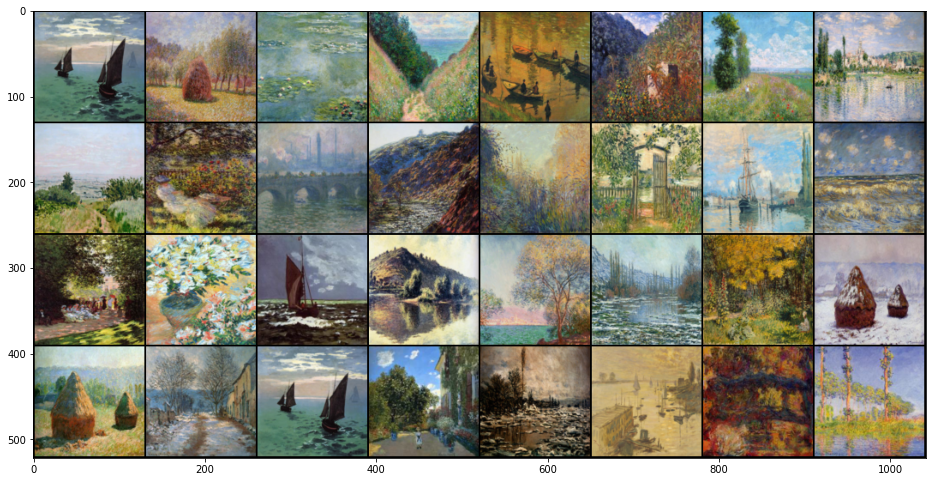

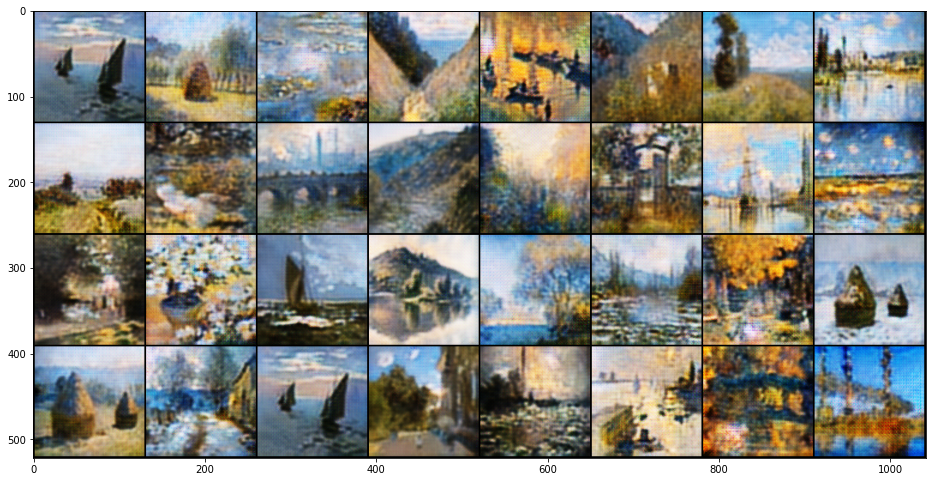

torch.Size([32, 3, 128, 128])


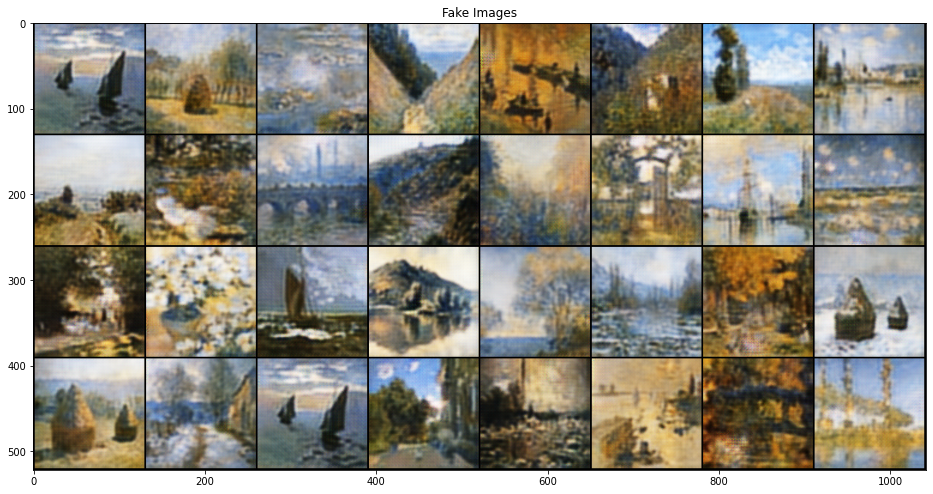

In [19]:
plt.figure(figsize=(16,24))
img_grid = torchvision.utils.make_grid(l.cpu(),normalize = True)
plt.imshow(np.transpose(img_grid,(1,2,0)))
plt.show()


plt.figure(figsize=(16,24))
img_grid2 = torchvision.utils.make_grid(j.cpu(),normalize = True)
plt.imshow(np.transpose(img_grid2,(1,2,0)))
plt.show()

plt.figure(figsize=(16,24))
plt.title("Fake Images")
img_grid3 = torchvision.utils.make_grid(r_m.cpu(),normalize = True)
print(i.shape)
plt.imshow(np.transpose(img_grid3,(1,2,0)))
plt.show()


In [23]:
model_save_name = 'Disc_Horse.pt'
path = F".//{model_save_name}" 
torch.save(disc_I.state_dict(), path)

In [24]:
model_save_name = 'Gen_Horse.pt'
path = F".//{model_save_name}" 
torch.save(gen_I.state_dict(), path)

In [25]:
model_save_name = 'Disc_Zebra.pt'
path = F".//{model_save_name}" 
torch.save(disc_M.state_dict(), path)

In [26]:
model_save_name = 'Gen_Zebra.pt'
path = F".//{model_save_name}" 
torch.save(gen_M.state_dict(), path)